In [1]:
import pandas as pd
import numpy as np
from utils import get_species, get_labels, get_labels_all

In [2]:
X, y, y_all = get_species(), get_labels(), get_labels_all()

In [3]:
raw = pd.read_csv("../data/raw.csv", index_col=[1, 4])

/Users/daniel/opt/anaconda3/envs/data/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3444: DtypeWarning: Columns (11,12,13,15) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [10]:
locations = raw["Geographical Region or Population"]

In [46]:
raw.iloc[:, :20]

Unnamed: 0    Author (year) BoiProject ID  \
Study_ID  Sample Accession                                              
GMHI-23   SAMEA3879547               0  Vogtmann (2016)    PRJEB12449   
          SAMEA3879551               1  Vogtmann (2016)    PRJEB12449   
          SAMEA3879543               2  Vogtmann (2016)    PRJEB12449   
          SAMEA3879565               3  Vogtmann (2016)    PRJEB12449   
          SAMEA3879546               4  Vogtmann (2016)    PRJEB12449   
...                                ...              ...           ...   
GMHI-17   SAMEA2737871           12527     Zhang (2015)     PRJEB6997   
          SAMEA2737819           12528     Zhang (2015)     PRJEB6997   
          SAMEA2737851           12529     Zhang (2015)     PRJEB6997   
GMHI-V-38 SAMD00114974           12530    Thomas (2019)     PRJDB4176   
GMHI-3    SAMEA2466888           12531    Zeller (2014)     PRJEB6070   

                                 RunID  Sequencing Platform  \
Study_ID  Sample Accession                                    
GMHI-23   SAMEA3879547      ERR1293689  Illumina HiSeq 2000   
          SAMEA3879551      ERR1293705  Illumina HiSeq 2000   
          SAMEA3879543      ERR1293673  Illumina HiSeq 2000   
          SAMEA3879565      ERR1293761  Illumina HiSeq 2000   
          SAMEA3879546      ERR1293685  Illumina HiSeq 2000   
...                                ...                  ...   
GMHI-17   SAMEA2737871       ERR589866  Illumina HiSeq 2000   
          SAMEA2737819       ERR589814  Illumina HiSeq 2000   
          SAMEA2737851       ERR589846  Illumina HiSeq 2000   
GMHI-V-38 SAMD00114974       DRR127728  Illumina HiSeq 2500   
GMHI-3    SAMEA2466888       ERR479042  Illumina HiSeq 2000   

                           Library layout (SE/PE)  \
Study_ID  Sample Accession                          
GMHI-23   SAMEA3879547                     PAIRED   
          SAMEA3879551                     PAIRED   
          SAMEA3879543                     PAIRED   
          SAMEA3879565                     PAIRED   
          SAMEA3879546                     PAIRED   
...                                           ...   
GMHI-17   SAMEA2737871                     PAIRED   
          SAMEA2737819                     PAIRED   
          SAMEA2737851                     PAIRED   
GMHI-V-38 SAMD00114974                     PAIRED   
GMHI-3    SAMEA2466888                     PAIRED   

                           Sample origin? (e.g., stool, mucosa)  \
Study_ID  Sample Accession                                        
GMHI-23   SAMEA3879547                                    stool   
          SAMEA3879551                                    stool   
          SAMEA3879543                                    stool   
          SAMEA3879565                                    stool   
          SAMEA3879546                                    stool   
...                                                         ...   
GMHI-17   SAMEA2737871                                    Stool   
          SAMEA2737819                                    Stool   
          SAMEA2737851                                    Stool   
GMHI-V-38 SAMD00114974                                    stool   
GMHI-3    SAMEA2466888                                    stool   

                             Disease status           Sample_ID  \
Study_ID  Sample Accession                                        
GMHI-23   SAMEA3879547              Control      MMRS84159866ST   
          SAMEA3879551              Control      MMRS25211151ST   
          SAMEA3879543              Control      MMRS32573774ST   
          SAMEA3879565              Control      MMRS20257302ST   
          SAMEA3879546              Control      MMRS86168210ST   
...                                     ...                 ...   
GMHI-17   SAMEA2737871      Healthy control                 C90   
          SAMEA2737819      Healthy control                 C63   
          SAMEA2737851    

In [41]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

c = 0.00001

def plot_pca(X, locations, highlight=None):
    plt.figure(figsize=(10, 10))
    pca = PCA(n_components=2)
    embedding = pca.fit_transform(X > c)
    locs = np.unique(locations)
    for lo in locs:
        alpha = 1 if highlight is None or lo == highlight else 0.03
        plt.scatter(embedding[(locations == lo).values.flatten(), 0], embedding[(locations == lo).values.flatten(), 1], label=lo, alpha=alpha)
    plt.legend()
    plt.show()

Austria


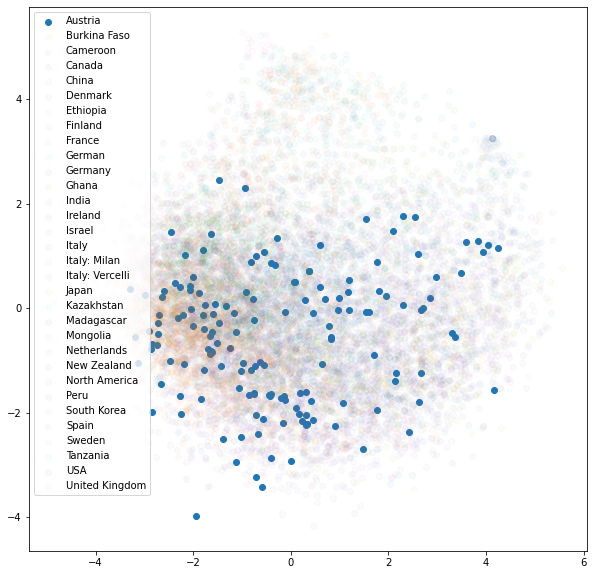

Burkina Faso


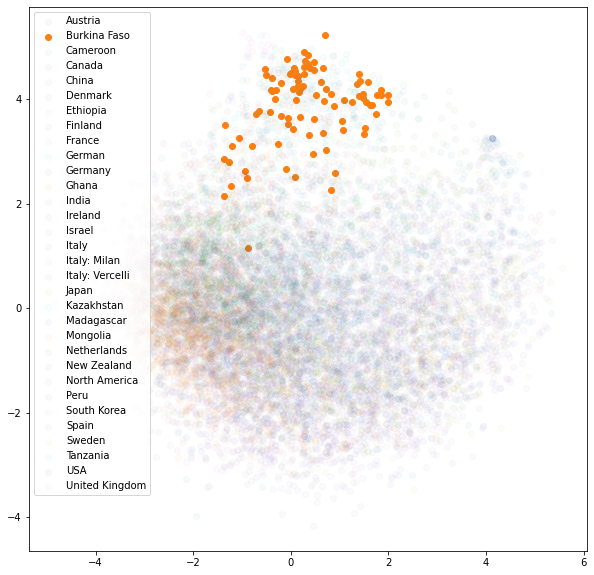

Cameroon


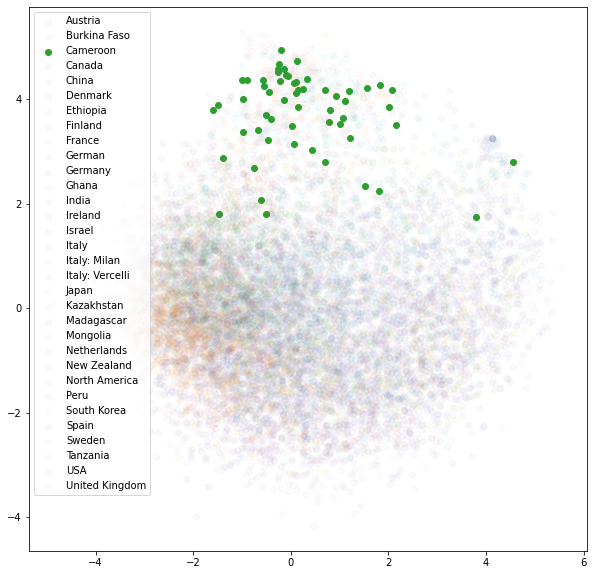

Canada


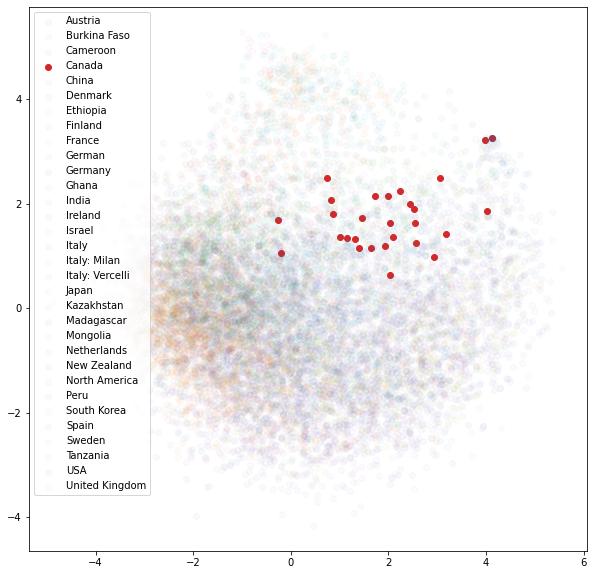

China


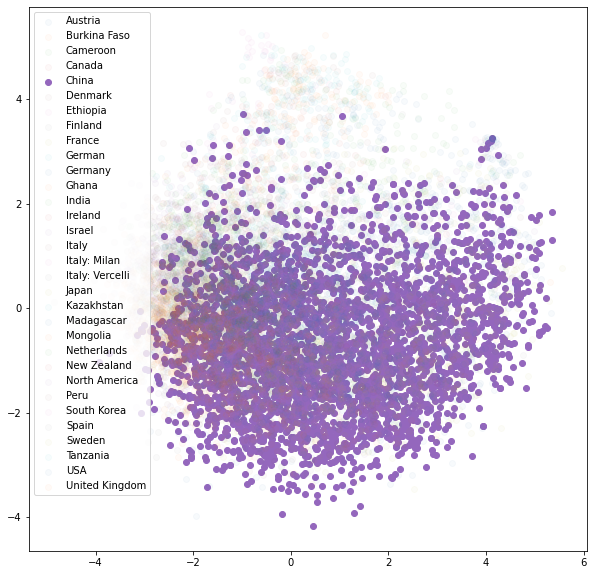

Denmark


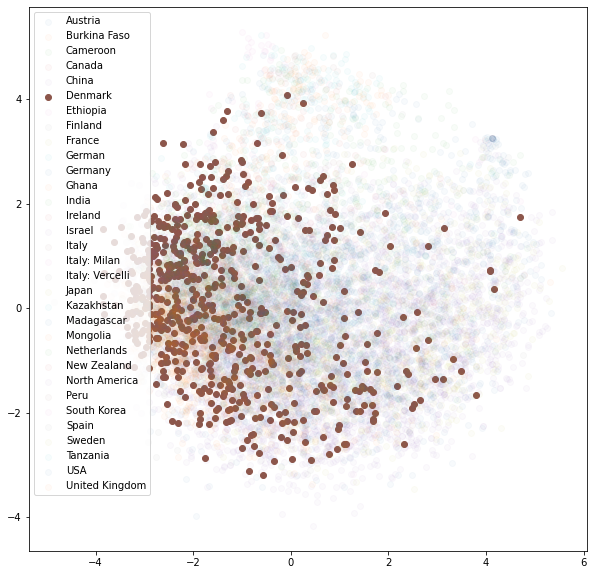

Ethiopia


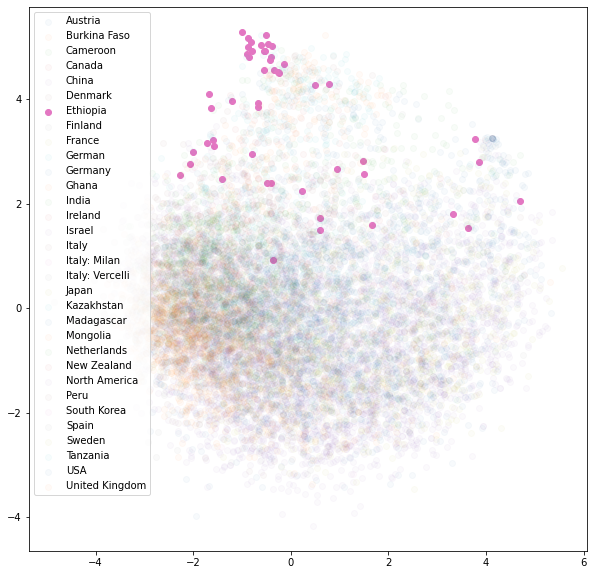

Finland


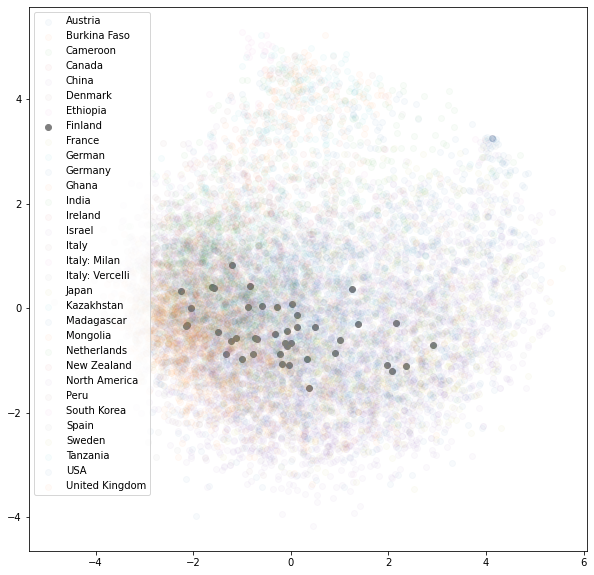

France


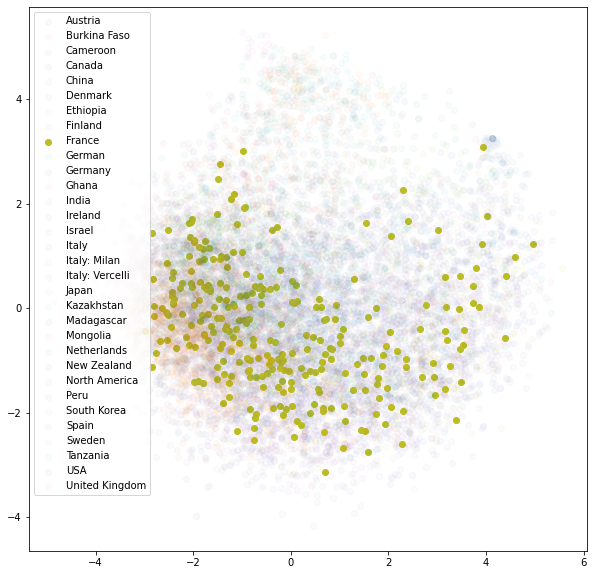

German


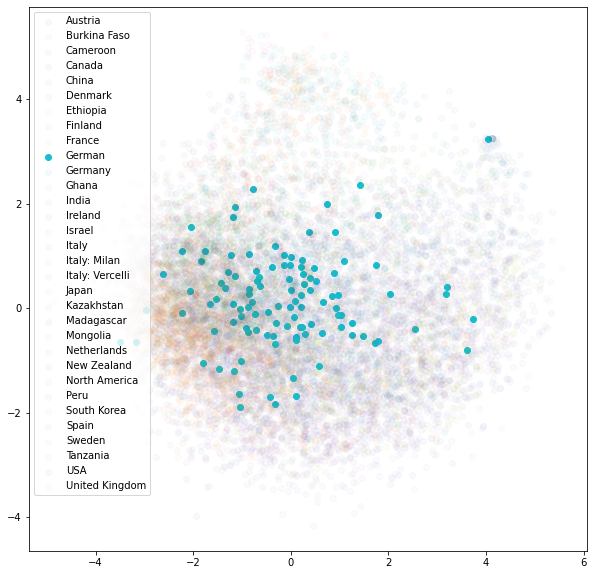

Germany


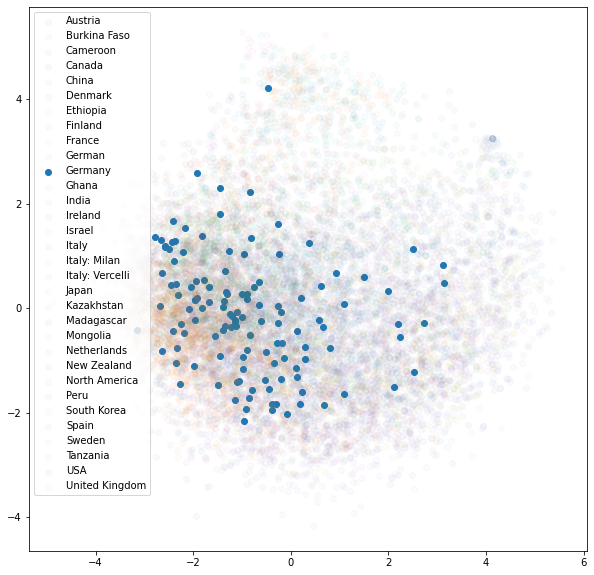

Ghana


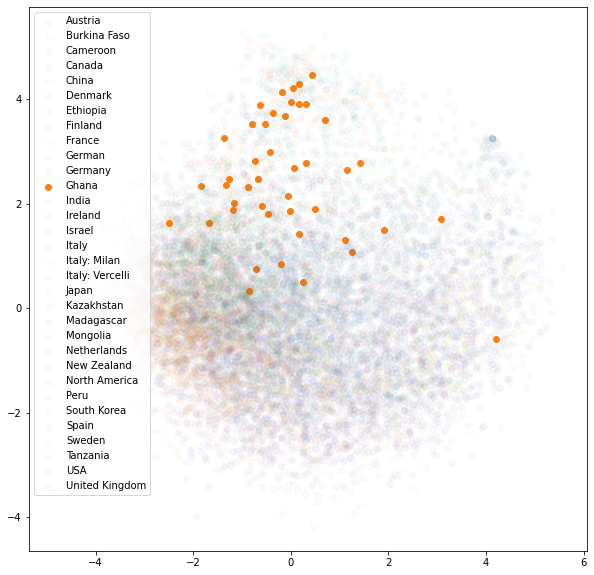

India


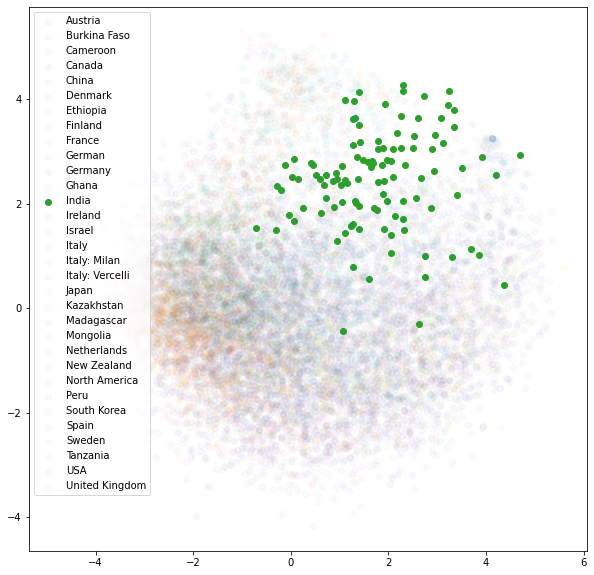

Ireland


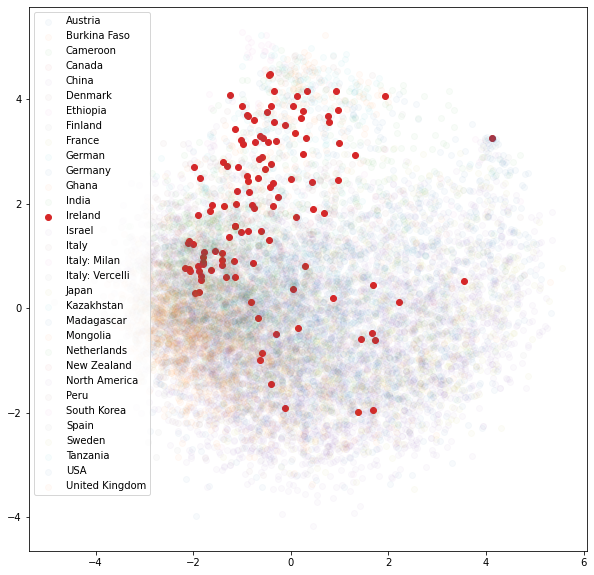

Israel


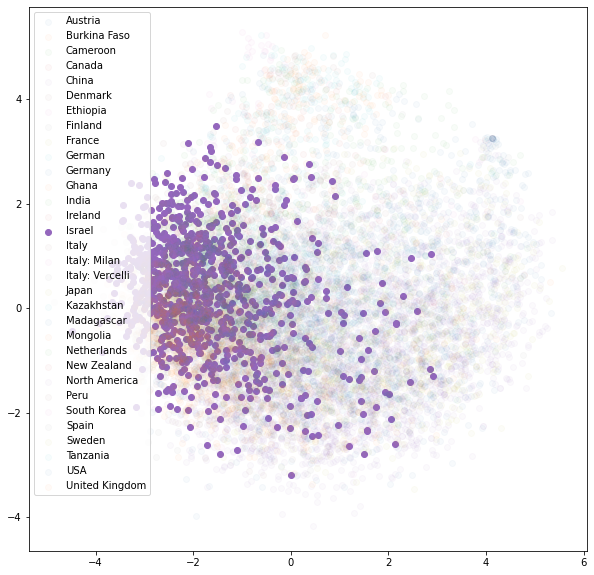

Italy


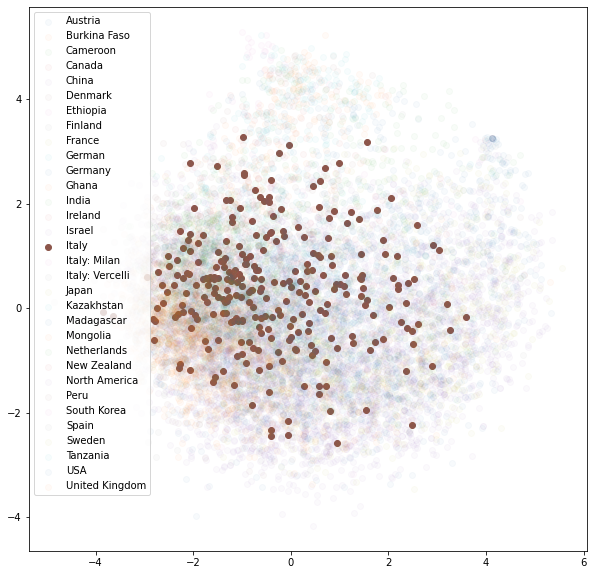

Italy: Milan


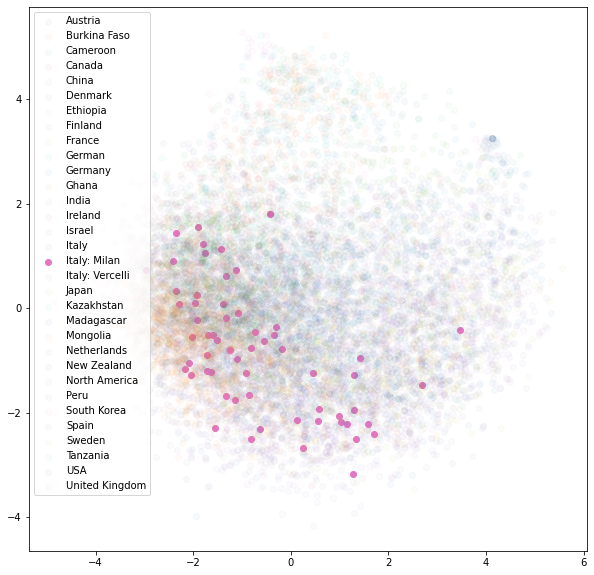

Italy: Vercelli


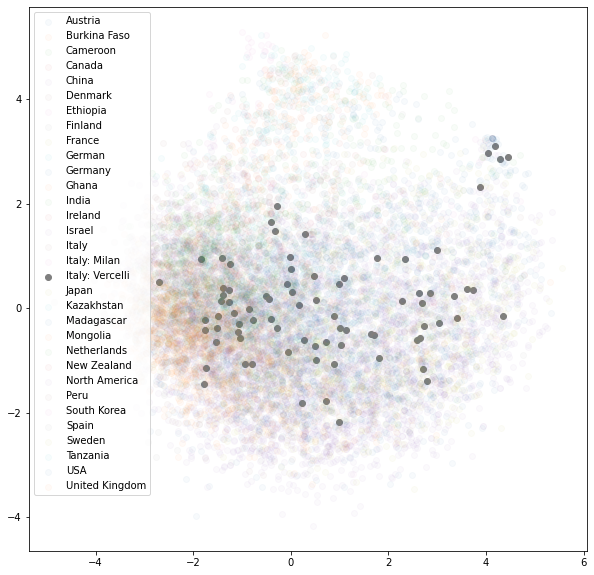

Japan


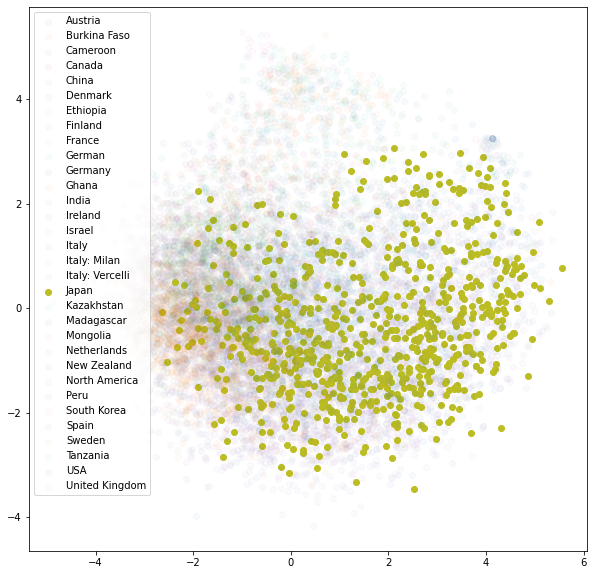

Kazakhstan


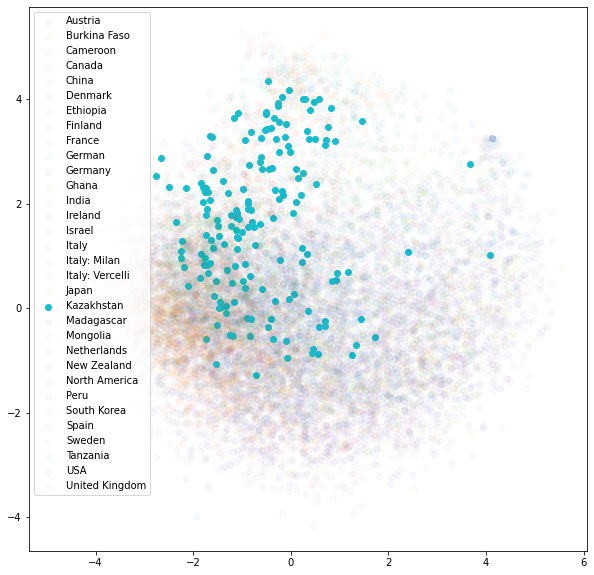

Madagascar


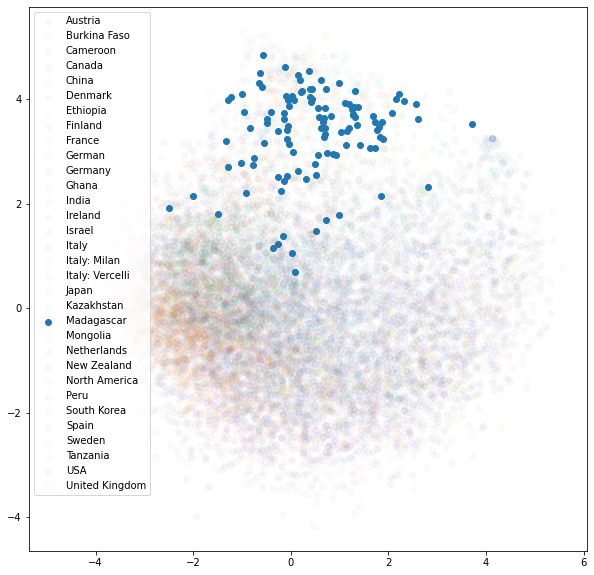

Mongolia


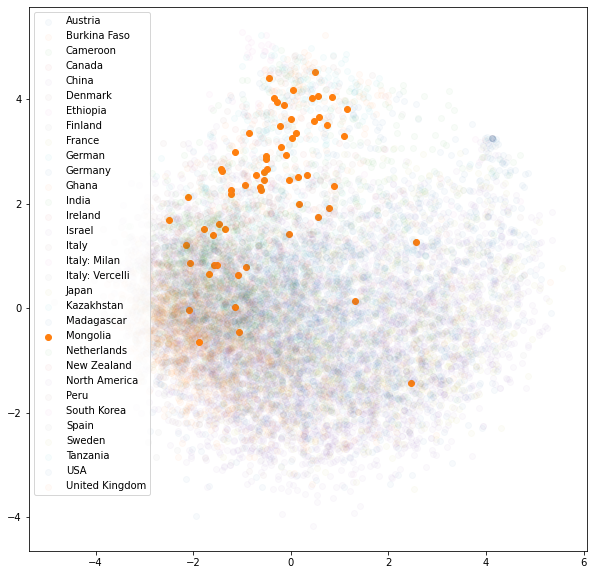

Netherlands


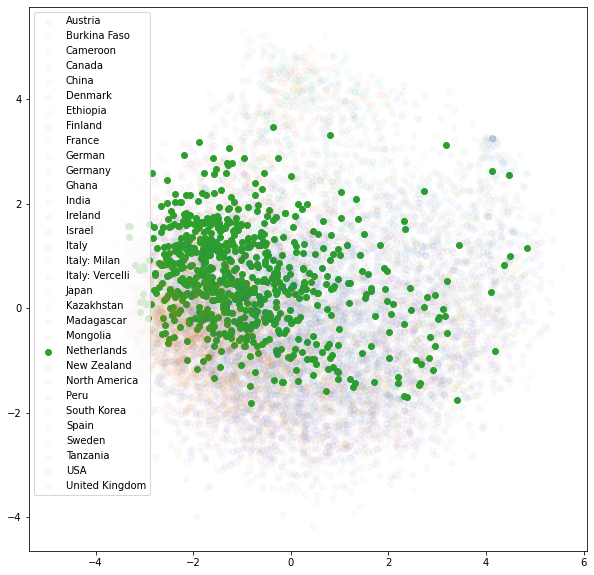

New Zealand


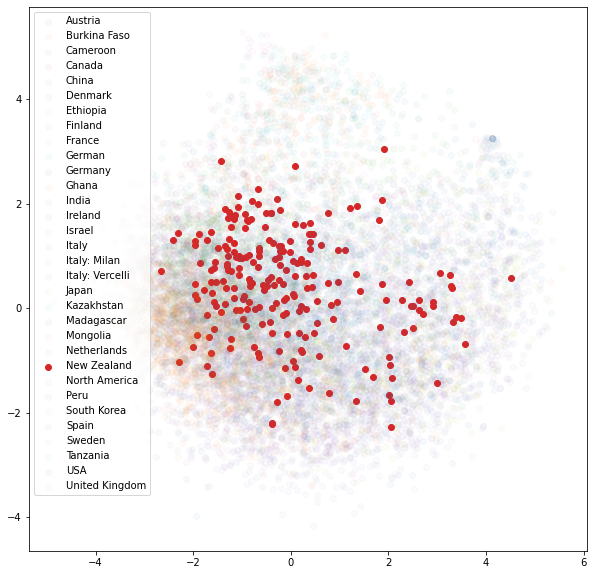

North America


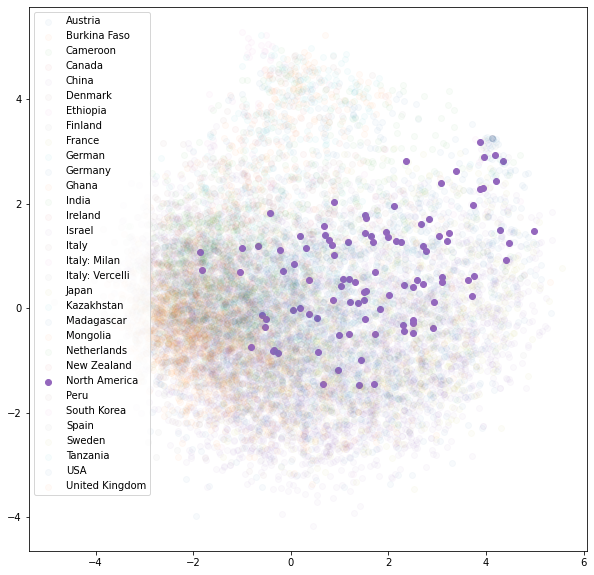

Peru


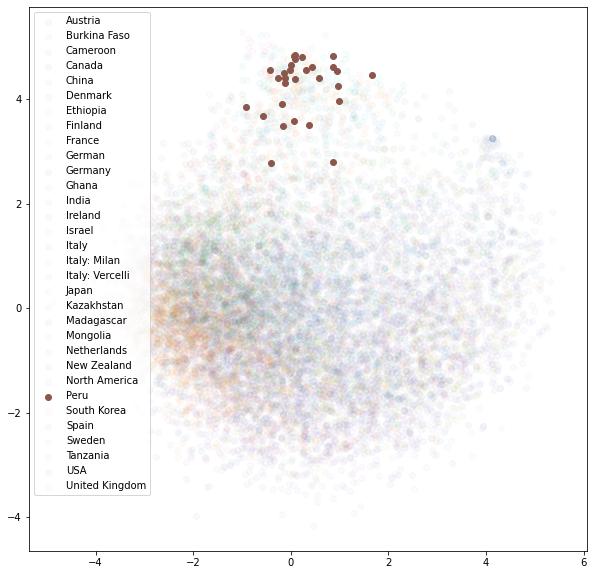

South Korea


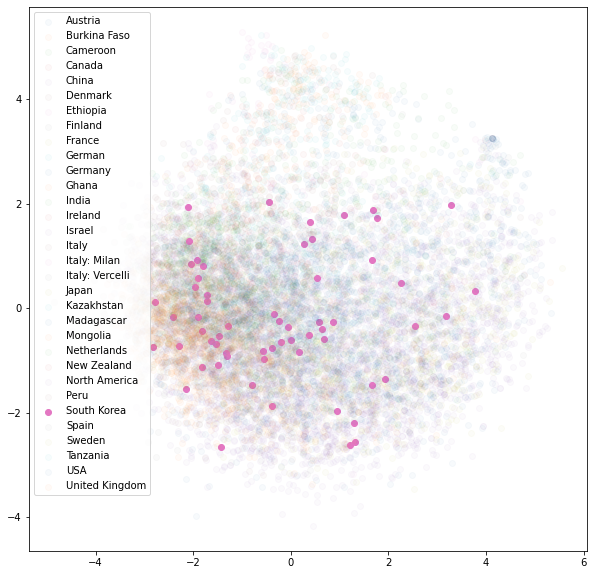

Spain


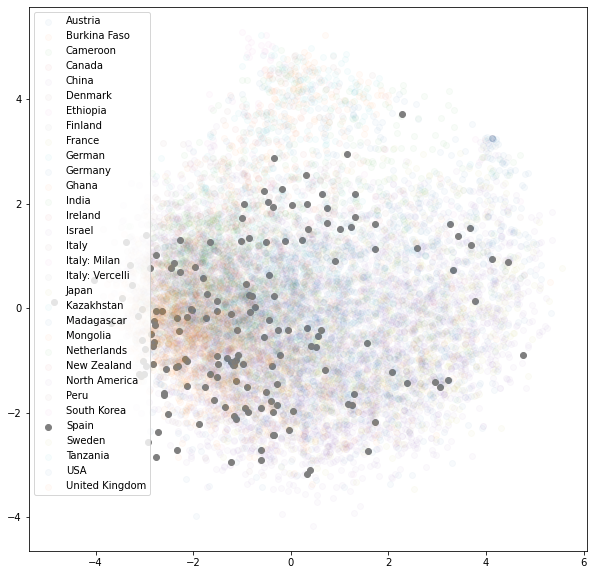

Sweden


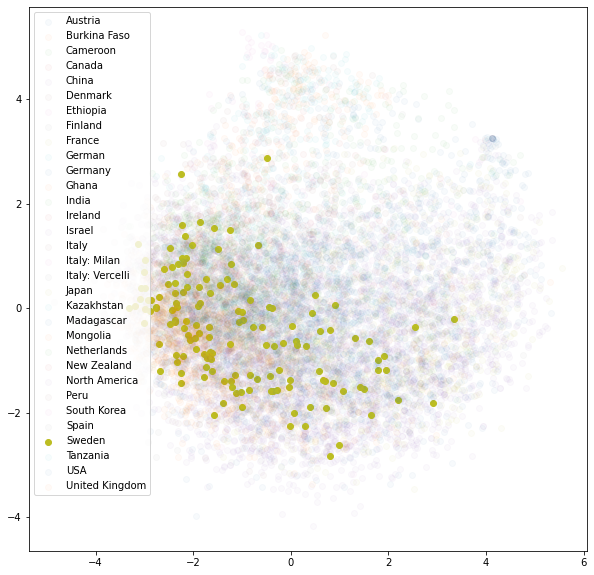

Tanzania


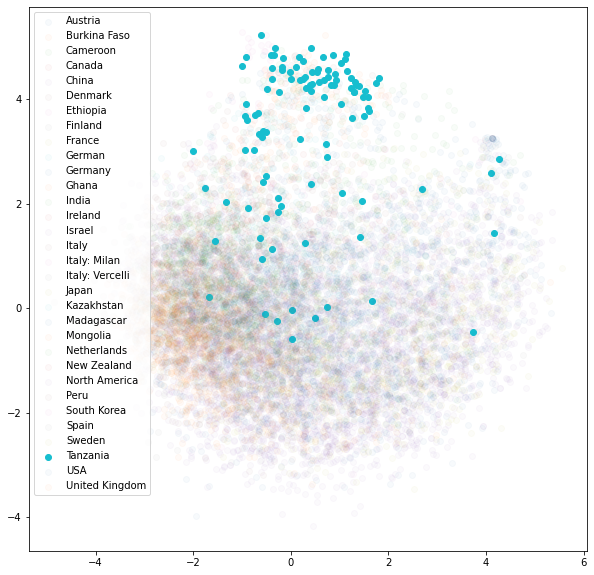

USA


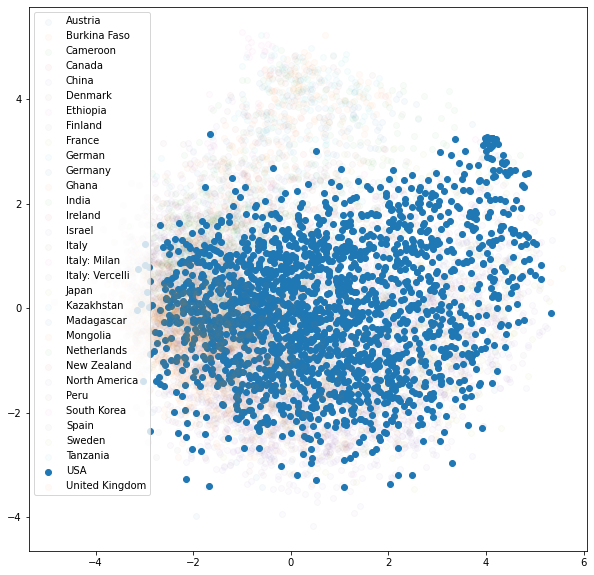

United Kingdom


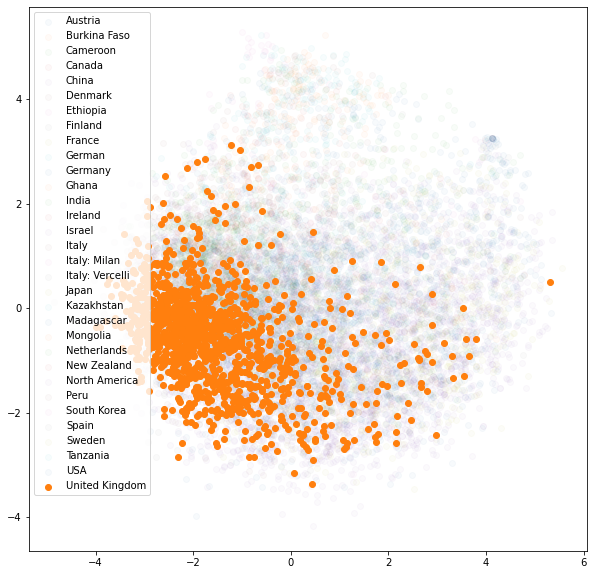

In [44]:
for lo in np.unique(locations):
    print(lo)
    plot_pca(X, locations, highlight=lo)